In [40]:
import albumentations as A
from PIL import Image
import numpy as np
from utils.vis import show_grays
from albumentations import RandomCrop, RandomCrop, ColorJitter, Compose, Normalize, RandomSizedCrop, Resize
from albumentations.augmentations.transforms import HorizontalFlip, VerticalFlip, InvertImg
from albumentations.augmentations.geometric.rotate import RandomRotate90, SafeRotate
from torchvision.transforms import RandomErasing, FiveCrop

In [94]:
def read_images(root, visualize = True, to_array=True):
    pathes = os.listdir(root)
    images = []
    for item in pathes:
        if item.split('.')[-1] in ['bmp','jpg']:
            
            image = Image.open(os.path.join(root,item))
            image = np.array(image) if to_array else image
            images.append(image)
    if visualize :
        show_grays(images)
        return images
    else : return images

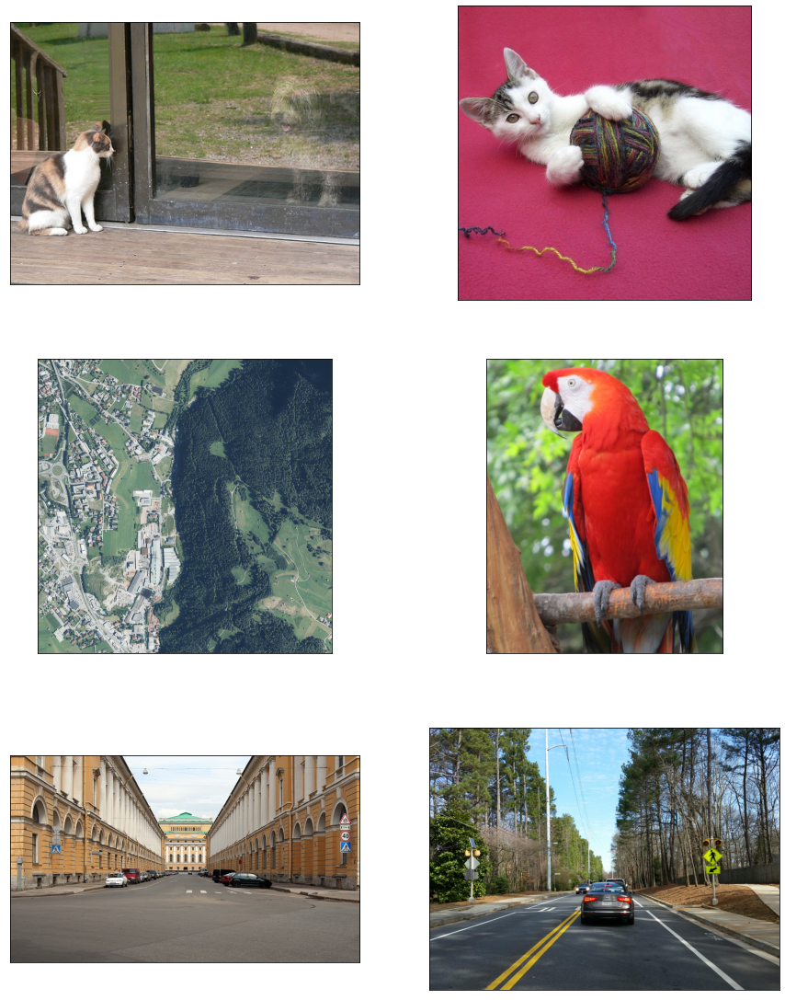

In [24]:
images = read_images('./homework3/')


In [103]:
def Augment(images, transform):
    aug = []
    for img in images : 
        try :
            a = transform(image=img)
        except : 
            a = transform(img)
            a = np.array(a)
        if isinstance(a, dict):
            aug.append(a['image']) 
        else :
            aug.append(a)
    show_grays(aug)


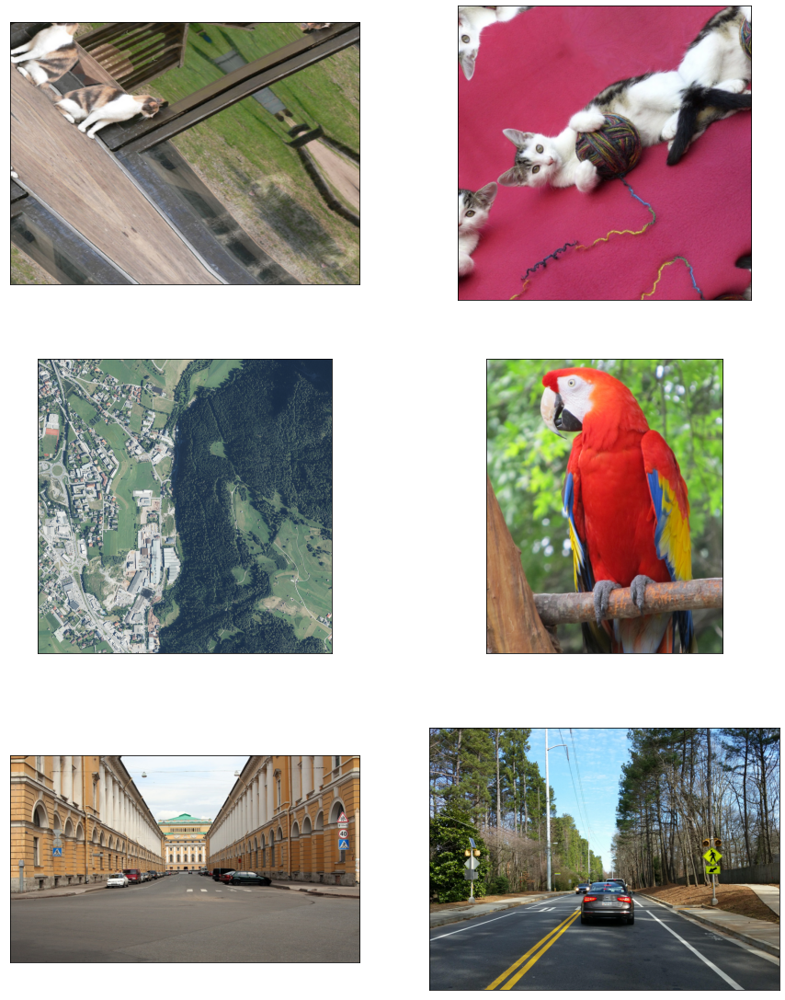

In [81]:
q1 = SafeRotate(limit=60,p=0.8)
Augment(images,q1)

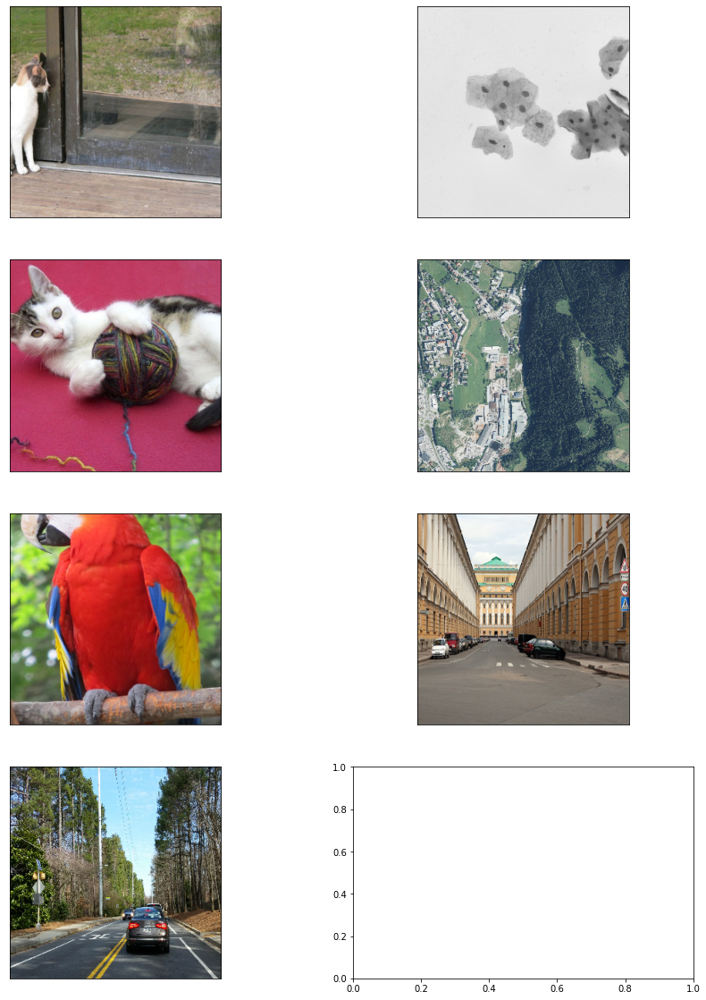

In [20]:
q2 = Compose([
    Resize(400,400),
    RandomCrop(300,300)
])
augment(images,q2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


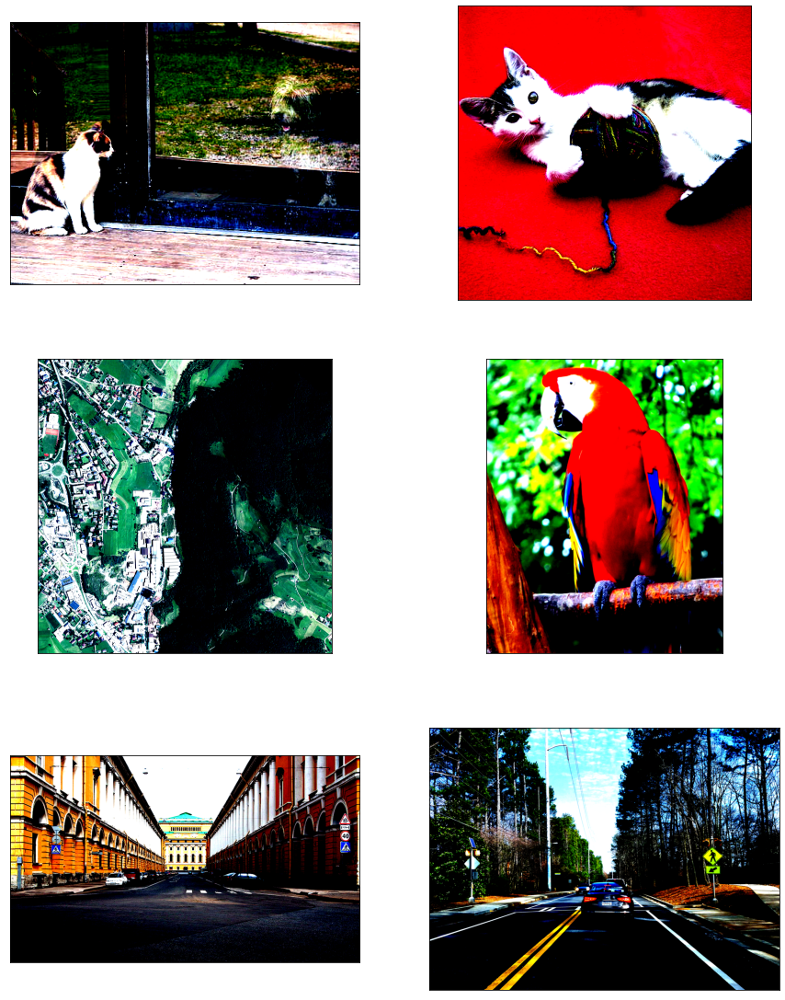

In [25]:
q3 = Normalize(mean=[0.485, 0.456, 0.406],
               std=[0.229, 0.224, 0.225])
augment(images, q3)

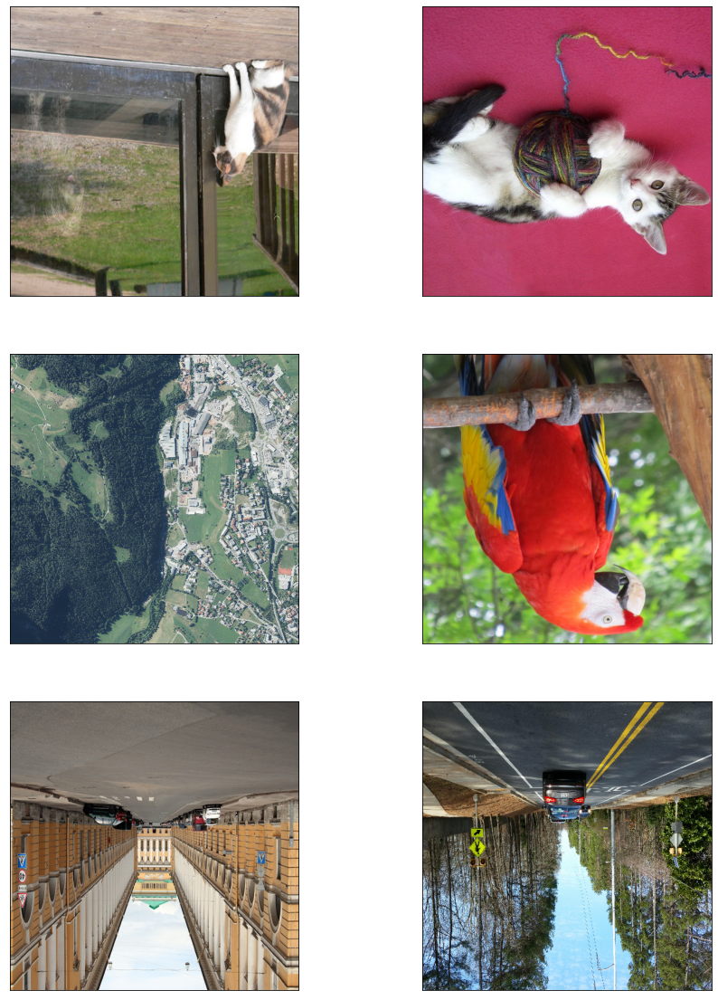

In [37]:
q4 = Compose([
    Resize(512,512),
    HorizontalFlip(0.5),
    VerticalFlip(0.5)
])
augment(images, q4)

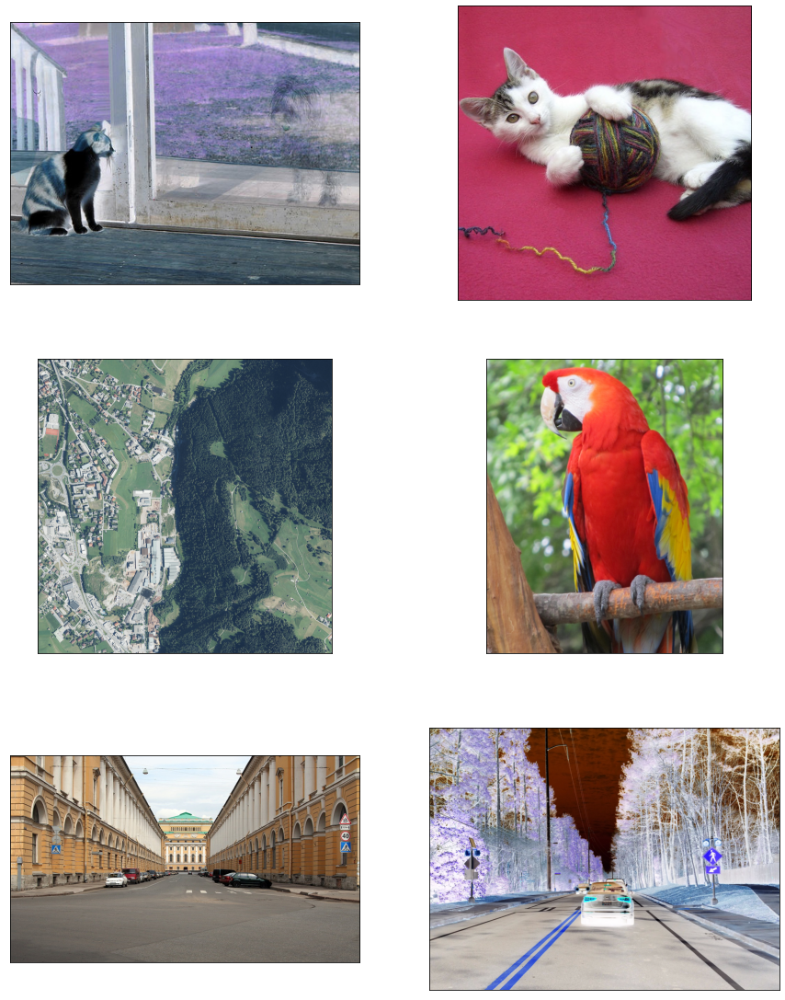

In [39]:
q5 = InvertImg()
augment(images, q5)

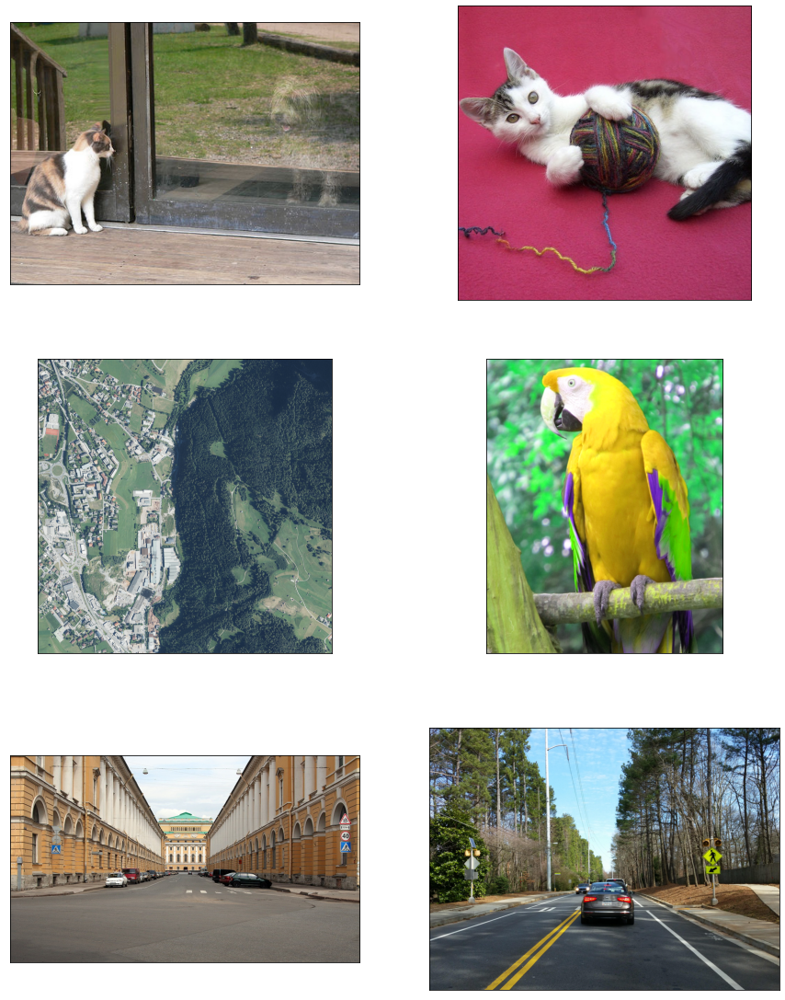

In [41]:
q6 = ColorJitter(brightness=0.4)
augment(images, q6)

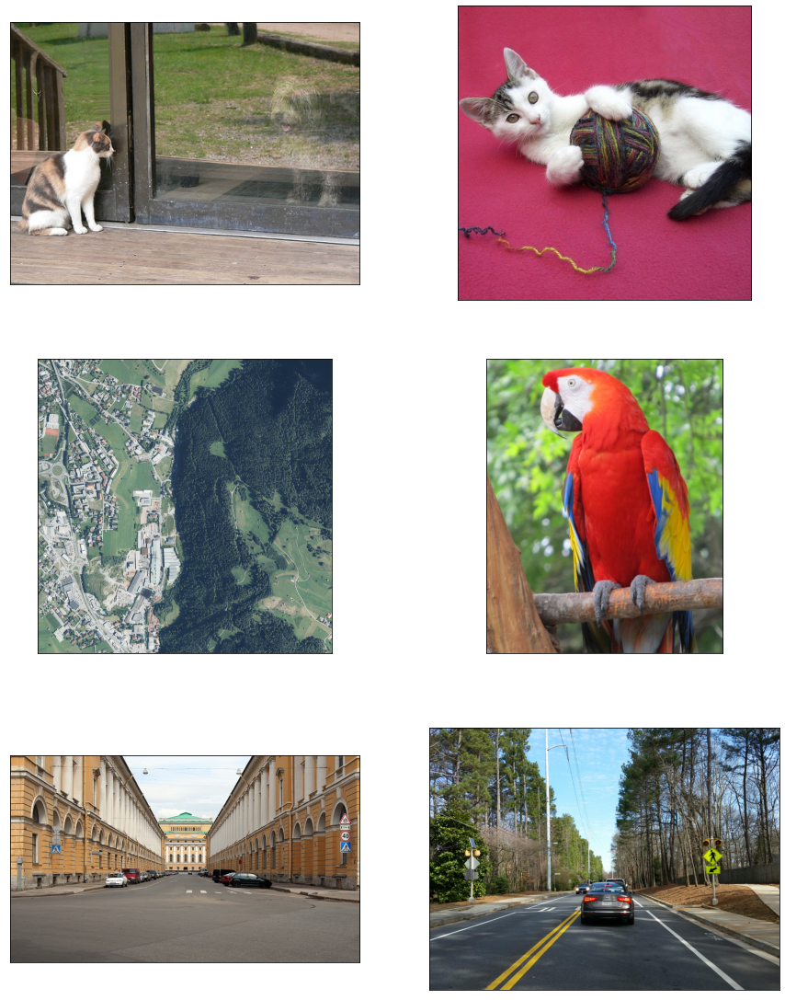

In [95]:
pil_images = read_images('./homework3/',to_array=False)

In [112]:
q7 = FiveCrop(100)
for a in q7(pil_images[0]):
    a.show()

In [139]:
q8 = RandomErasing()
q8(im)